# Facial Information Recognition
- POPOT--CHAPUIS Maxime
- COLIN Valentin
- PANTELEICIUC Ion

# Packages

In [1]:
# Pour gérer le dataset
from glob import glob
import os
import imageio.v2 as imageio
import numpy as np

# Pour construire notre modèle
import tensorflow as tf
tf.compat.v1.enable_eager_execution()
from tensorflow import keras
from tensorflow.keras.layers import Input
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.layers import Dropout 
from tensorflow.keras.layers import Conv2DTranspose
from tensorflow.keras.layers import concatenate
    
# Pour Afficher les illustrations, faire les schémas...
import IPython
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from sklearn.metrics import confusion_matrix

# Préparation des données

On utilise un modèle avec des images de tailles variables et référençant 11 classes différentes.

In [2]:
# Dimension de redimensionnement, attention à ne pas choisir trop petit pour garder un encodage décent
image_h = 128
image_w = 128
input_shape = (image_h, image_w, 3)

num_classes = 11

body_part = ["background",
"skin",
"left eyebrow",
"right eyebrow",
"left eye",
"right eye",
"nose",
"upper lip",
"inner mouth",
"lower lip",
"hair"]

## Gestion des datasets

On récupère l'emplacement de chaque image, préalablement stocké dans son propre dataset.

In [3]:
# Path menant au dataset
data_set_path = os.getcwd()

In [4]:
def load_dataset(path):
    """
    path - chemin vers le dossier contenant le dataset
    return : les listes des paths menant à chaque image
    """
    train_x = sorted(glob(os.path.join(path, "LaPa", "train", "images", "*.jpg")))
    train_y = sorted(glob(os.path.join(path, "LaPa", "train", "labels", "*.png")))

    valid_x = sorted(glob(os.path.join(path, "LaPa", "val", "images", "*.jpg")))
    valid_y = sorted(glob(os.path.join(path, "LaPa", "val", "labels", "*.png")))

    test_x = sorted(glob(os.path.join(path, "LaPa", "test", "images", "*.jpg")))
    test_y = sorted(glob(os.path.join(path, "LaPa", "test", "labels", "*.png")))

    
    return (train_x, train_y), (valid_x, valid_y), (test_x, test_y)

In [5]:
(train_x, train_y), (valid_x, valid_y), (test_x, test_y) = load_dataset(data_set_path)
print(f"""
Nombre d'élément par dataset :
X_Train_set: {len(train_x)};
Y_Train_set: {len(train_y)};
X_Valid_set: {len(valid_x)};
Y_Valid_set: {len(valid_y)};
X_Test_set: {len(test_x)};
Y_Test_set: {len(test_y)}.
""")


Nombre d'élément par dataset :
X_Train_set: 18168;
Y_Train_set: 18168;
X_Valid_set: 2000;
Y_Valid_set: 2000;
X_Test_set: 2000;
Y_Test_set: 2000.



Par économie de temps, nous choisissons de n'entraîner notre modèle que sur 10 000 images du dataset.

In [6]:
IMAGE_MAX = 10_000

train_x, train_y = train_x[:IMAGE_MAX], train_y[:IMAGE_MAX]

#test_x, test_y = test_x[], test_y[:2000]

print(f"""
X_Train_set: {len(train_x)};
Y_Train_set: {len(train_y)};
X_Train_set: {len(test_x)};
Y_Train_set: {len(test_y)};
""")


X_Train_set: 10000;
Y_Train_set: 10000;
X_Train_set: 2000;
Y_Train_set: 2000;



### Conclusion 
Nous avons un data_set très correcte pour l'entraînement (plus de 18 000 images pour le train set et 2 000 pour le test set). <br>
On choisit de réduire le train à 10 000 images car :
 - on se fixe pour objectif d'entraîner le modèle en 1h30 max (pour pouvoir itérer un minimum)
 - on souhaite réaliser plusieurs EPOCHS

## Redimensionnement des images

Les images dans notre data_set sont des tailles quelconque. Nous allons toutes les redimensionner.

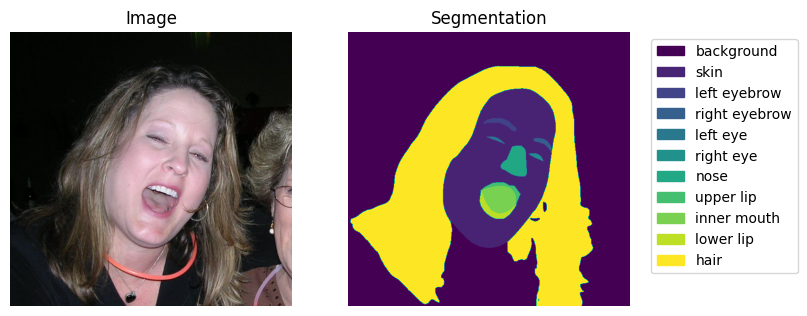

In [7]:
image_number = 59
img = imageio.imread(train_x[image_number])
mask = imageio.imread(train_y[image_number])

fig, arr = plt.subplots(1, 2, figsize=(8, 8))
arr[0].imshow(img)
arr[0].set_title('Image')
arr[0].axis('off')

mask_show = arr[1].imshow(mask)
arr[1].set_title('Segmentation')
arr[1].axis('off')



values = np.unique(mask.ravel())

colors = [ mask_show.cmap(mask_show.norm(value)) for value in values]
patches = [ mpatches.Patch(color=colors[i], label=f"{body_part[i]}") for i in range(len(body_part))]
plt.legend(handles=patches, bbox_to_anchor=(1.05, 1), loc=2)


On convertit toutes les images au format RGB, et les masks en nuance de gris.

In [8]:
def process_path(image_path, mask_path):
    """
    image_path - string d'un path menant à une image
    mask_path - string d'un path menant à un mask
    Return : l'image en RGB (origine_height, origine_width, 3) et le mask en variation de gris (origine_width, origine_height, 1)
    """
    img = tf.io.read_file(image_path)
    img = tf.io.decode_jpeg(img, channels=3) # RGB en sortie
    img = tf.image.convert_image_dtype(img, tf.float32)

    mask = tf.io.read_file(mask_path)
    mask = tf.image.decode_png(mask, channels=1)
    return img, mask

def preprocess(image, mask):
    """
    image - tensor de dimension (origine_height, origine_width, 3) représentant une image
    mask -tensor de dimenion (origine_height, origine_width, 1)
    Return - mêmes objets aux dimension (image_h, image_w) définis en hyperparamètres
    """
    input_image = tf.image.resize(image, (image_h, image_w), method='nearest')
    input_mask = tf.image.resize(mask, (image_h, image_w), method='nearest')
    print(input_image.shape)

    return input_image, input_mask

dataset = tf.data.Dataset.from_tensor_slices((train_x, train_y))
image_ds = dataset.map(process_path)
processed_image_ds = image_ds.map(preprocess)
print(type(processed_image_ds))


(128, 128, 3)
<class 'tensorflow.python.data.ops.dataset_ops.MapDataset'>


In [9]:
def display(display_list):
    """
    display_list - liste d'images à afficher dans l'ordre, input, true_mask, predicted_mask
    name_list - liste de l'emplacement des fichiers
    """
    plt.figure(figsize=(8, 8))

    title = ['Input Image', 'True Mask', 'Predicted Mask']

    for i in range(len(display_list)):
        plt.subplot(1, len(display_list), i+1)
        
        plt.title(title[i])
        plt.imshow(tf.keras.preprocessing.image.array_to_img(display_list[i])) #, c = label, cmap=list_color_def) # dico_color)
        if i==2:
            plt.legend(handles=patches, bbox_to_anchor=(1.05, 1), loc=2)
        plt.axis('off')
    plt.show()

On vérifie le bon fonctionnement du redimensionnement :

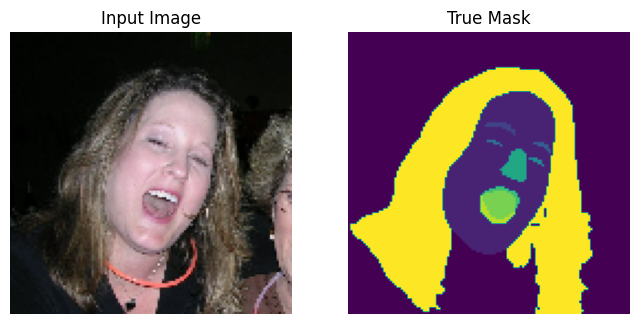

In [10]:
for image, mask in processed_image_ds.take(image_number + 1):
    sample_image, sample_mask = image, mask
display([sample_image, sample_mask])

## Création des datasets finaux

Fusion de deux listes de path en un dataset d'images :

In [11]:
BUFFER_SIZE = 500
BATCH_SIZE = 32

def fusion_dataset(image, mask):
    """"
    image - list of string, path to the image
    mask - list of string, path to the mask
    """
    dataset  = tf.data.Dataset.from_tensor_slices((image, mask))
    image_dataset = dataset.map(process_path)
    processed_image_dataset = image_dataset.map(preprocess)
    full_dataset = processed_image_dataset.cache().shuffle(BUFFER_SIZE).batch(BATCH_SIZE)
    return full_dataset

In [12]:
train_dataset = fusion_dataset(train_x, train_y)

(128, 128, 3)


In [13]:
test_dataset = fusion_dataset(test_x, test_y)

(128, 128, 3)


### Conclusion
Dans le training set nous avons 10 000 élements de dimensions image_h * image_w * 3 et nous cherchons à classifier chaque pixel dans 11 catégories différentes.

# Construction du modèle

## Encoder

In [14]:
def conv_block(inputs=None, n_filters=32, dropout_prob=0, max_pooling=True):

    first_conv = Conv2D(n_filters,
                  3,# Kernel size   
                  activation='relu',
                  padding='same',
                  kernel_initializer= 'he_normal')(inputs)
    
    second_conv = Conv2D(n_filters,
                  3,
                  activation='relu',
                  padding='same',
                  kernel_initializer= 'he_normal')(first_conv)

    if dropout_prob > 0:
        second_conv = Dropout(dropout_prob)(second_conv)
         
    if max_pooling:
        next_layer = MaxPooling2D(2,strides=2)(second_conv)
        
    else:
        next_layer = second_conv
        
    skip_connection = second_conv
    
    return next_layer, skip_connection

## Decoder

In [15]:
def upsampling_block(expansive_input, contractive_input, n_filters=32):

    up = Conv2DTranspose(
                 n_filters,
                 3,
                 strides=2,
                 padding='same')(expansive_input)
    
    merge = concatenate([up, contractive_input], axis=3)
    
    conv = Conv2D(n_filters,
                  3,
                  activation='relu',
                  padding='same',
                  kernel_initializer= 'he_normal')(merge)
    conv = Conv2D(n_filters,
                  3,   
                  activation='relu',
                  padding='same',
                  kernel_initializer= 'he_normal')(conv)
    
    return conv

## Model

In [16]:
def unet_model(input_size=(96, 128, 3), n_filters=32, n_classes=23):

    inputs = Input(input_size)
    
    cblock1 = conv_block(inputs, n_filters)
    cblock2 = conv_block(inputs=cblock1[0], n_filters=n_filters * 2)
    cblock3 = conv_block(inputs=cblock2[0], n_filters=n_filters * 4)
    cblock4 = conv_block(inputs=cblock3[0], n_filters=n_filters * 8, dropout_prob=0.3)
    
    cblock5 = conv_block(inputs=cblock4[0], n_filters=n_filters * 16, dropout_prob=0.3, max_pooling=False) 

    ublock6 = upsampling_block(cblock5[0], cblock4[1],  n_filters * 8)
    ublock7 = upsampling_block(ublock6, cblock3[1],  n_filters * 4)
    ublock8 = upsampling_block(ublock7, cblock2[1],  n_filters * 2)
    ublock9 = upsampling_block(ublock8, cblock1[1],  n_filters)

    conv9 = Conv2D(n_filters,
                 3,
                 activation='relu',
                 padding='same',
                 kernel_initializer='he_normal')(ublock9)


    conv10 = Conv2D(n_classes, 1, padding='same')(conv9)
    
    model = tf.keras.Model(inputs=inputs, outputs=conv10)

    return model

# Utilisation du modèle

## Instanciation 

On réduit par deux le nombre de filtre préconiser pour économiser du temps de calcul.

In [17]:
UNet_4_face = unet_model(input_size=(image_h, image_w, 3), n_filters=32, n_classes=num_classes)

In [18]:
#UNet_4_face.summary()

On paramètre la création d'un checkpoint à l'issu de chaque EPOCH.

## Training

Ce training prenant environ 2h30, il est possible de charger directement le modèle dans la section suivante.

In [19]:
#checkpoint_path = "training/cp.ckpt"
#checkpoint_dir = os.path.dirname(checkpoint_path)

#cp_callback = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path,
#                                                 save_weights_only=True,
#                                                 verbose=1)

In [20]:
#UNet_4_face.save_weights(checkpoint_path.format(epoch=0))


In [21]:
#UNet_4_face.load_weights('training/pre_trained_weight.h5')

On compile le modèle en utilisant le Adam optimizer, une fonction de coût logarithmique sur les catégories.

In [22]:
UNet_4_face.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

In [23]:
#EPOCHS = 10
#model_history_32 = UNet_4_face.fit(train_dataset,
#                                epochs=EPOCHS,
#                                #callbacks=[cp_callback],
#                                validation_data= test_dataset
#                                  )

In [24]:
#UNet_4_face.save('saved_model/32filters_epoch10_10k_photos')
#np.save('saved_model/32filters_epoch10_10k_photos.npy',model_history_32.history)

On sauvegarde le modèle et l'history !

## Analyse des résultats

Au cas où, par erreur, l'entraînement a été relancé, on recharche un modèle précédement enregistré.

In [25]:
UNet_4_face_saved = tf.keras.models.load_model('saved_model/32filters_epoch10_10k_photos')
model_history_32_saved =np.load('saved_model/32filters_epoch10_10k_photos.npy',allow_pickle='TRUE').item()

In [26]:
def afficher_accuracy(model_history):
    (fig, ax) = plt.subplots(figsize=(4, 4))
    train_acc_plot = plt.plot(model_history['acc'], label='training_accuracy')
    test_acc_plot = plt.plot(model_history['val_acc'], label = 'test_accuracy')
    y_axes = [(i/10) for i in range(11)]
    ax.set_yticks(y_axes)
    plt.legend(loc="lower right")
    plt.xlabel("Number of Epoch")
    plt.ylabel("Accuracy")

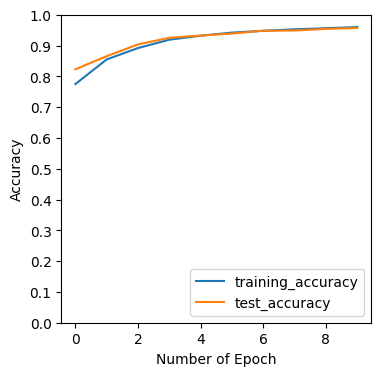

In [27]:
afficher_accuracy(model_history_32_saved)

In [28]:
def afficher_lost(model_history):
    (fig, ax) = plt.subplots(figsize=(4, 4))
    plt.plot(model_history['loss'], label='training_loss')
    plt.plot(model_history['val_loss'], label = 'test_loss')
    y_axes = [(i/10) for i in range(11)]
    ax.set_yticks(y_axes)
    plt.legend(loc="upper right")
    plt.xlabel("Number of Epoch")
    plt.ylabel("Loss")

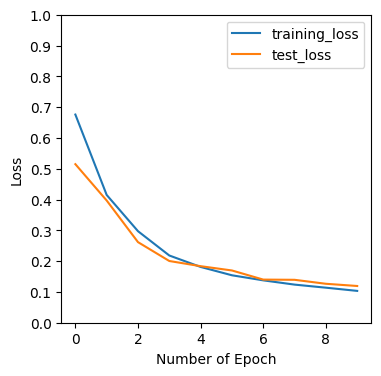

In [29]:
afficher_lost(model_history_32_saved)

In [30]:
def create_mask(pred_mask):
    """
    garder à l'esprit que notre modèle nous renvoie des probabilités, pour chaque pixel on récupère donc la classe la plus prob
    """
    pred_mask = tf.argmax(pred_mask, axis=-1)
    pred_mask = pred_mask[..., tf.newaxis]
    return pred_mask[0]

In [31]:
def show_predictions(model, dataset, num=1):
    """
    Displays the first image of each of the num batches
    """
    for image, mask in dataset.take(num):
        pred_mask = model.predict(image, verbose = 0)
        display([image[0], mask[0], create_mask(pred_mask)])

### Matrice de confusion

In [32]:
def image_normalized(image_path):
    img = tf.io.read_file(image_path)
    img = tf.io.decode_jpeg(img, channels=3) # RGB en sortie
    img = tf.image.convert_image_dtype(img, tf.float32)
    img = tf.image.resize(img, (image_h, image_w), method='nearest')
    return img

def mask_normalized(mask_path):
    mask = tf.io.read_file(mask_path)
    mask = tf.image.decode_png(mask, channels=1)
    mask = tf.image.resize(mask, (image_h, image_w), method='nearest')
    return mask

In [33]:
print(len(test_x))
print(len(test_y))

2000
2000


In [34]:
def afficher_confusion_matrix(test_x, test_y, model, number_to_test=100):
    predictions = []
    true_labels = []

    for i in range(number_to_test): # par gain de temps, on fait une moyenne sur les 100 premières images du tests_set#len(test_x)):
        img = image_normalized(test_x[i])
        mask = mask_normalized(test_y[i])
        prediction = model.predict(np.expand_dims(img, 0), verbose = 0)

        predictions.append(np.argmax(prediction, axis=-1))
        true_labels.append(mask.numpy().flatten())

    predictions = np.array(predictions).flatten()
    true_labels = np.array(true_labels).flatten()

    conf_mat = confusion_matrix(true_labels, predictions, normalize='true')

    plt.imshow(conf_mat, cmap='YlOrRd')
    plt.colorbar()
    plt.xlabel('Predicted labels')
    plt.ylabel('True labels')

    for i in range(len(conf_mat)):
        for j in range(len(conf_mat[i])):
            if i == j:
                plt.text(j, i, int(round(conf_mat[i][j] * 100)), ha="center", va="center", color="white")
            else:
                plt.text(j, i, int(round(conf_mat[i][j] * 100)), ha='center', va='center', color='black')

    plt.xticks(np.arange(len(body_part)))
    plt.yticks(np.arange(len(body_part)))
    plt.gca().set_xticklabels(body_part, rotation=90)
    plt.gca().set_yticklabels(body_part)

    #plt.title("+ de 25% du temps de travail a été à dessiner ce graph, profitez-en")
    plt.title("Confusion Matrix of the label relativly to the given class")
    plt.figure(figsize=(20,20))


    conf_mat = confusion_matrix(true_labels, predictions)
    wrong_class_prop = np.zeros((1, len(body_part)))
    sum_of_error = conf_mat.sum() - np.trace(conf_mat)
    for i in range(len(conf_mat)):
        wrong_class_prop[0, i] = (conf_mat[i, :].sum() - conf_mat[i, i]) / sum_of_error

    #print(wrong_class_prop.sum())

    (fig, ax) = plt.subplots(figsize=(7, 4))
    plt.plot(range(len(body_part)), wrong_class_prop[0], marker = 'o')
    
    y_axes = [(i/10) for i in range(6)]
    ax.set_yticks(y_axes)

    
    plt.xticks(np.arange(len(body_part)))
    plt.gca().set_xticklabels(body_part, rotation=90)
    plt.xlabel('Predicted labels')
    plt.ylabel('Portion of wrong label')
    plt.title("Proportion of wrongly labeled pixel among the wrong pixels")



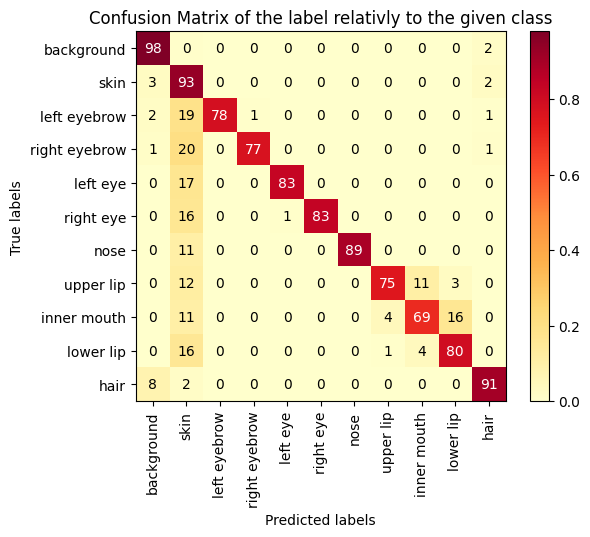

<Figure size 2000x2000 with 0 Axes>

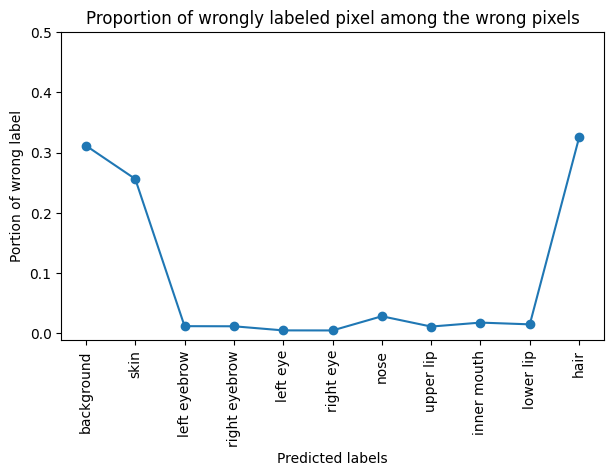

In [35]:
nbr_image_estimation = 100
afficher_confusion_matrix(test_x, test_y, UNet_4_face_saved, nbr_image_estimation) # en pratique on fait une moyenne des erreur sur les 100 premières images

### Consultation des résultats

Une image du training :

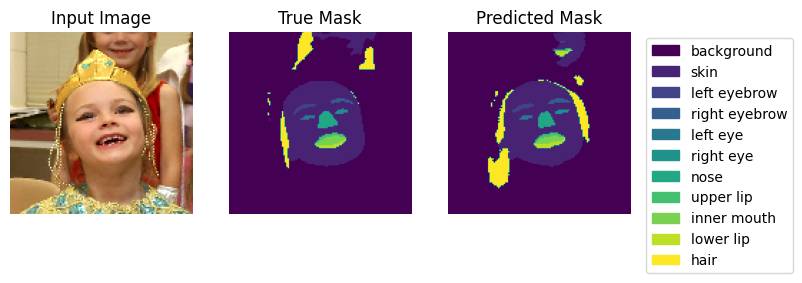

In [36]:
show_predictions(UNet_4_face_saved, train_dataset, 1)

Quelques images du test_set :

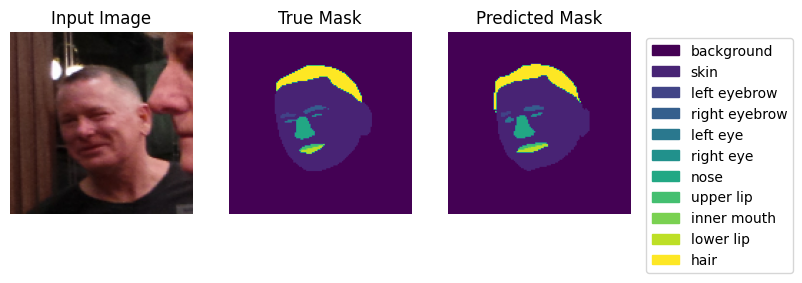

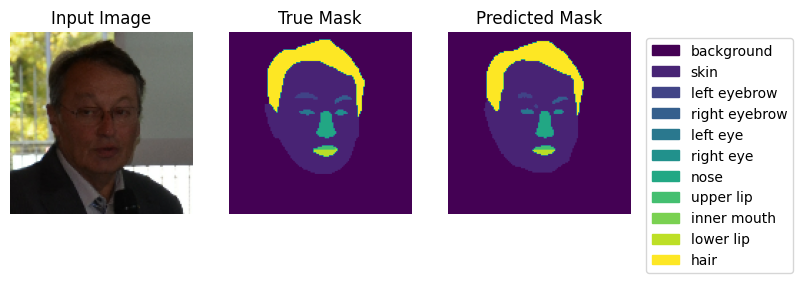

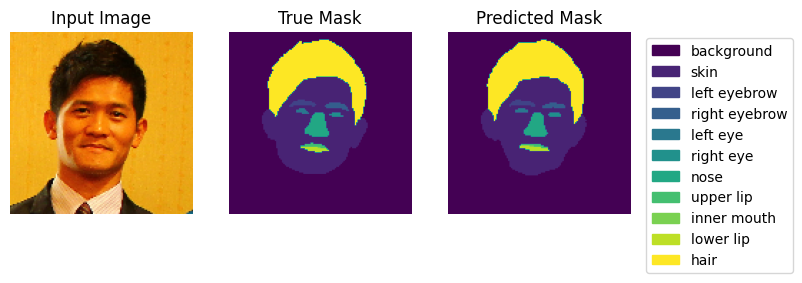

In [37]:
image_test_a_presenter = 3
show_predictions(UNet_4_face_saved, test_dataset, image_test_a_presenter)

## Custom validation

Placez l'image que vous voulez tester dans le dossier 'perso/' au format .jpg

In [38]:
def predict_list_of_image(paths_to_image, model):    
    for i in range(len(paths_to_image)):

        img = tf.io.read_file(paths_to_image[i])
        img = tf.io.decode_jpeg(img, channels=3) # RGB en sortie
        img = tf.image.convert_image_dtype(img, tf.float32)

        input_image_rs = tf.image.resize(img, (image_h, image_w), method='nearest')
        input_image = input_image_rs[tf.newaxis, ...]
        pred_mask = model.predict(input_image, verbose = 0)

        plt.figure(figsize=(6, 6))
        
        display_list = [input_image_rs, create_mask(pred_mask)]
        title = ['Input Image', 'Predicted Mask']

        for i in range(len(display_list)):
            plt.subplot(1, len(display_list), i+1)

            plt.title(title[i])
            plt.imshow(tf.keras.preprocessing.image.array_to_img(display_list[i])) #, c = label, cmap=list_color_def) # dico_color)
            if i==1:
                plt.legend(handles=patches, bbox_to_anchor=(1.05, 1), loc=2)
            plt.axis('off')
        plt.show()

In [39]:
perso_path = 'perso/'
images_perso_path = sorted(glob(os.path.join(perso_path, "*.jpg")))

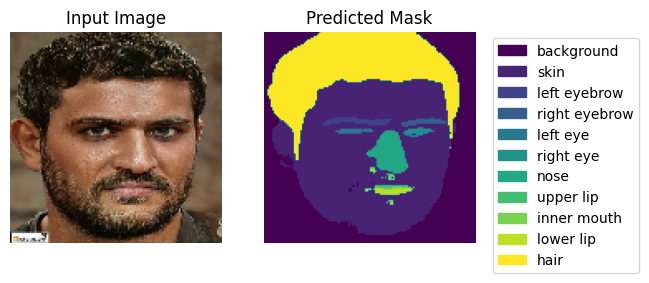

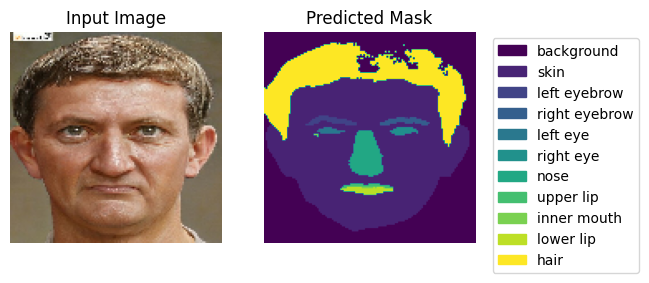

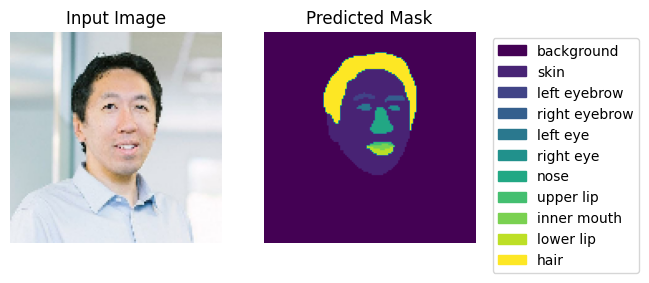

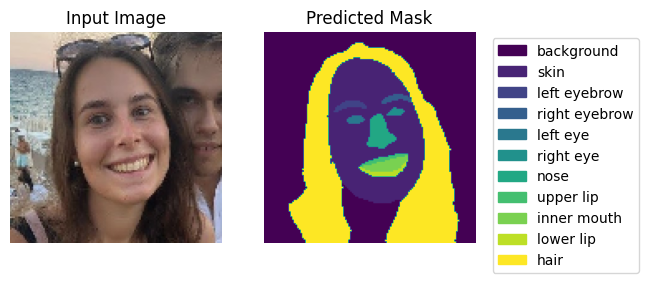

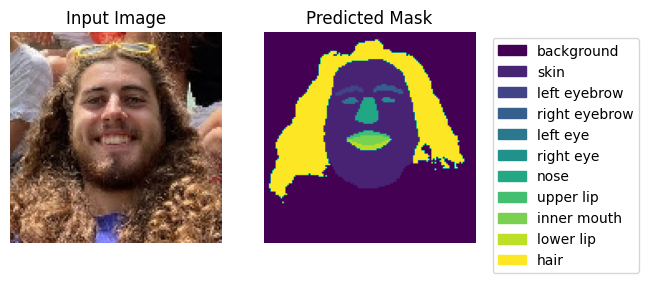

...

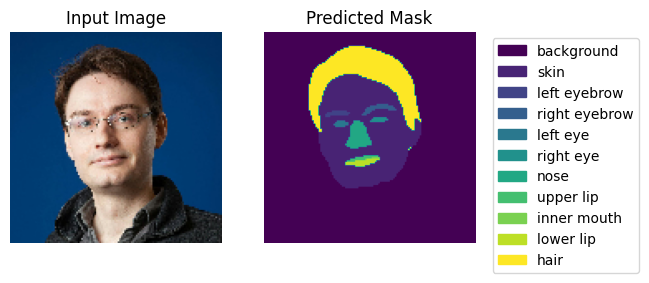

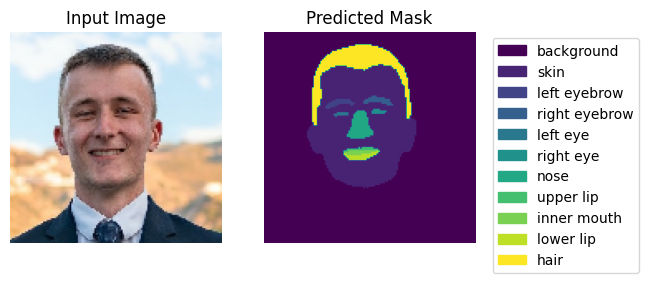

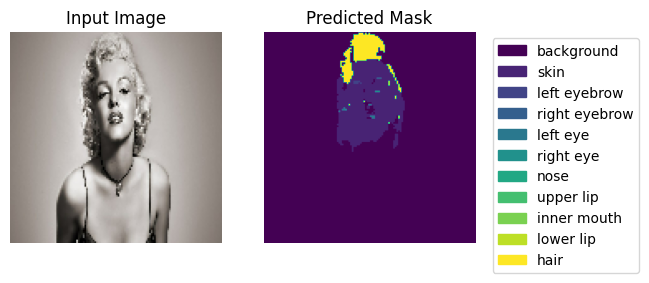

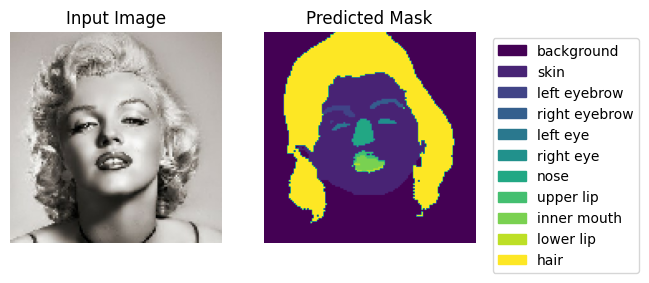

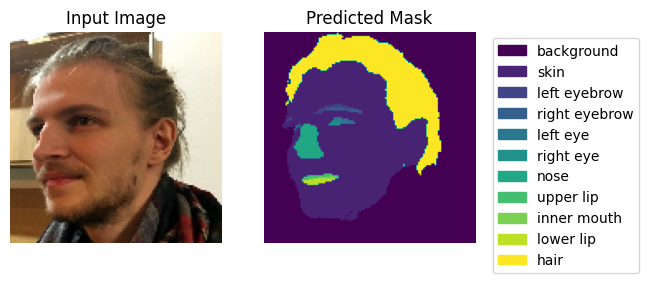

In [40]:
predict_list_of_image(images_perso_path, UNet_4_face_saved)

- Le modèle a du mal sur les images non-centrées mais se généralise plutôt bien !
- Sans suprise a plus de mal sur les dessins / peinture et les jeux de lumière

# Résumé :

### Contexte

L'objectif est de faire de la segmentation de visage en utilisant 11 classes.
Il y a un visage à classifier par image (le plus central).

Pour cela on utilise le Dataset "LaPa" qui nous fournit plus de de 22 000 images de bonnes qualités (non-standardisés).
Après une consultation de plusieurs échantillons, nous n'avons pas trouvé de "mismatch" flagrants (même si le délimitage n'est pas "pixel perfect").

On implémente le modèle UNet pour cela :

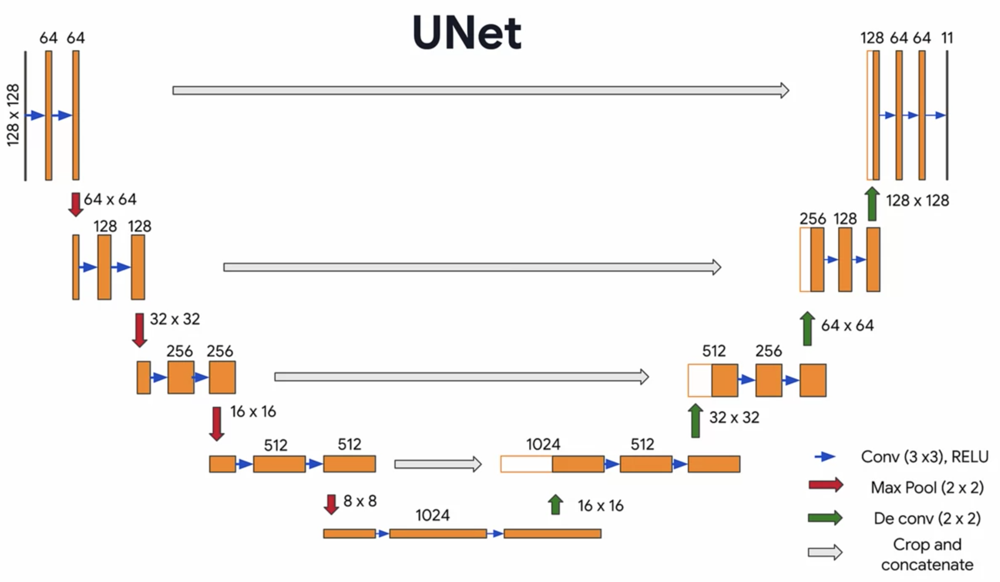

In [41]:
IPython.display.Image("illustrations/schema_convnet.png", width=800)

### "1er" training - 32 filtres, 10k images, 128*128, 10 epochs

Pour accélérer l'entraînement du modèle :
- on utilise que 32 filtres (et non 64 comme préconisé)
- on se limite à 10 000 images dans le training, ce qui nous permet de faire 10 epochs
- on redimensionne les images en 128*128

résultat : 2h30 d'entraînement !

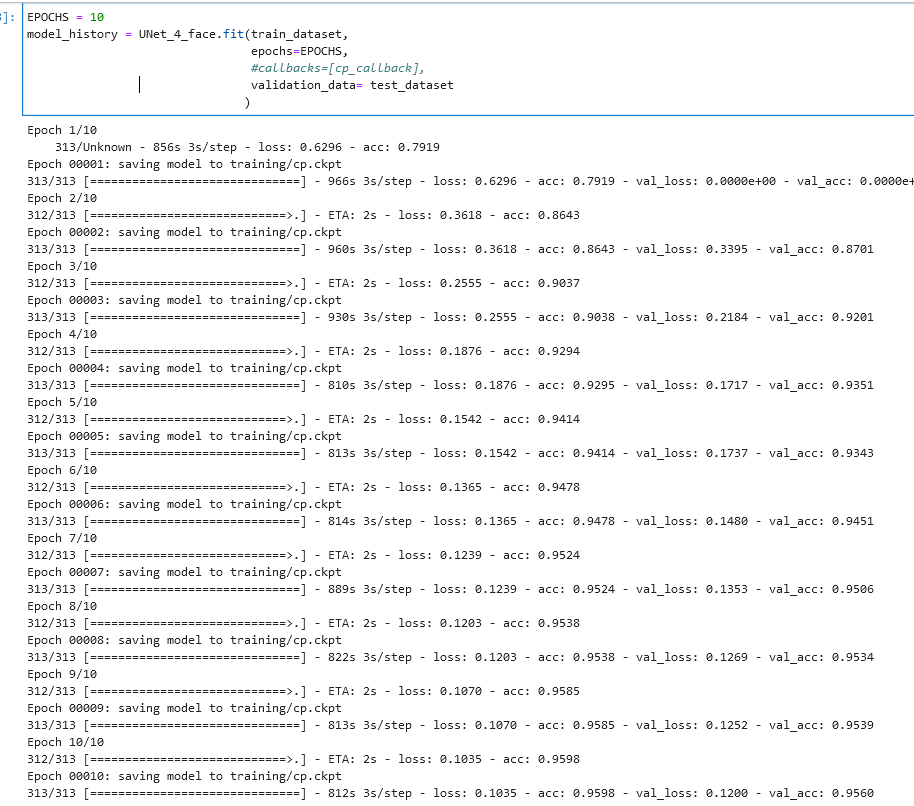

In [42]:
IPython.display.Image("illustrations/preuve_training_32filtres.png")

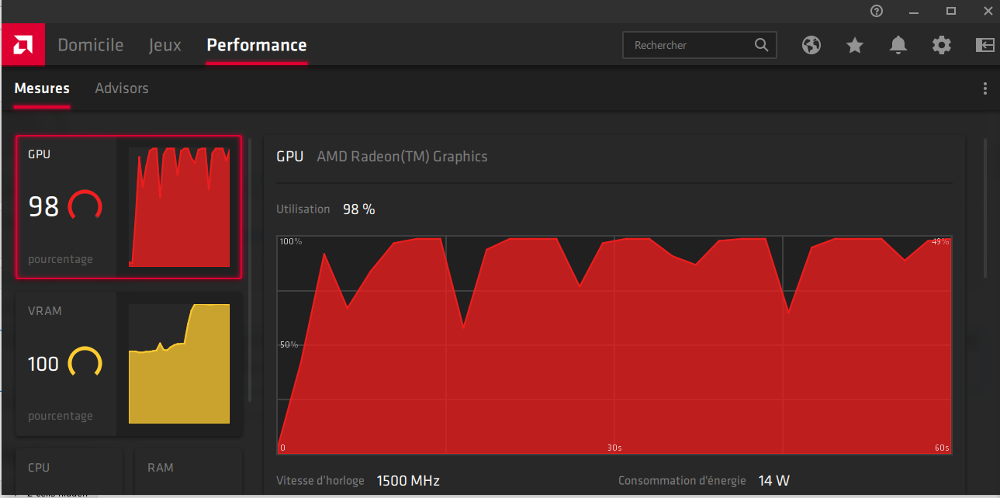

In [43]:
IPython.display.Image('illustrations/stonk.png', width=600)

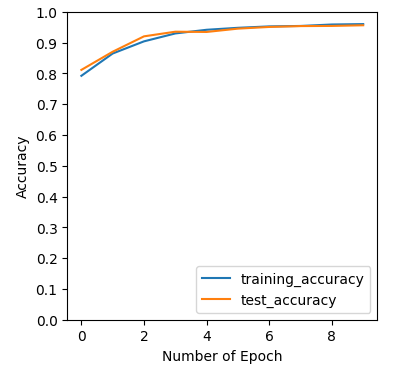

In [44]:
IPython.display.Image("illustrations/32filtres_10k_acc.png")

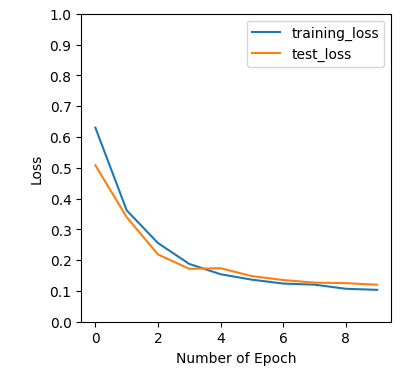

In [45]:
IPython.display.Image("illustrations/32filtres_10k_loss.png")

In [46]:
UNet_4_face_saved = tf.keras.models.load_model('saved_model/32filters_epoch10_10k_photos')
model_history_32_saved =np.load('saved_model/32filters_epoch10_10k_photos.npy',allow_pickle='TRUE').item()

In [47]:
#UNet_4_face_saved.summary()

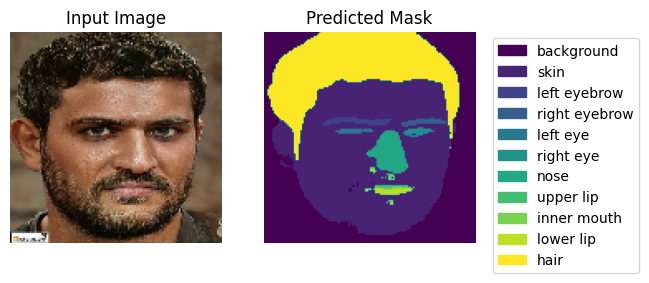

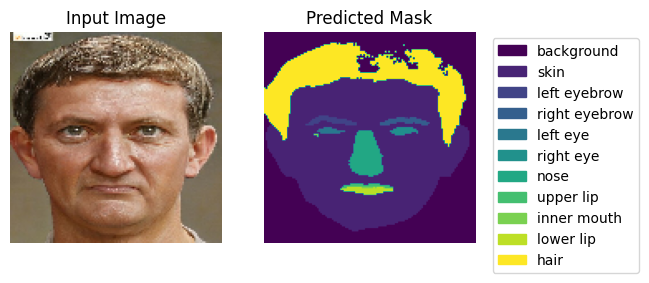

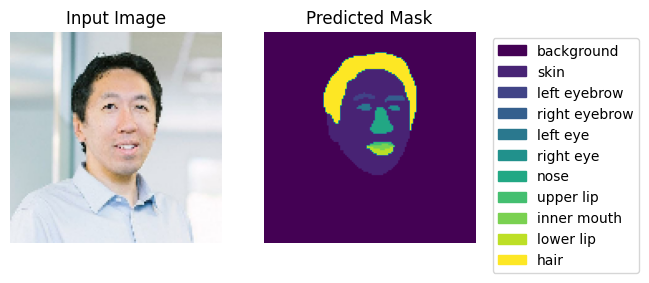

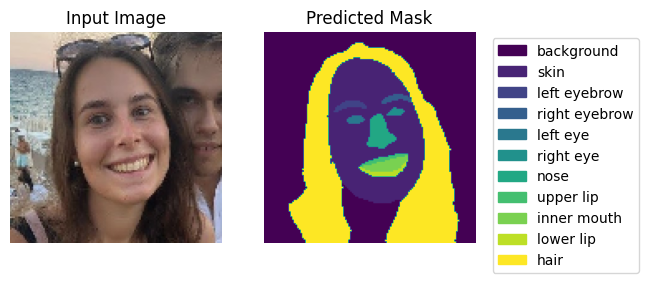

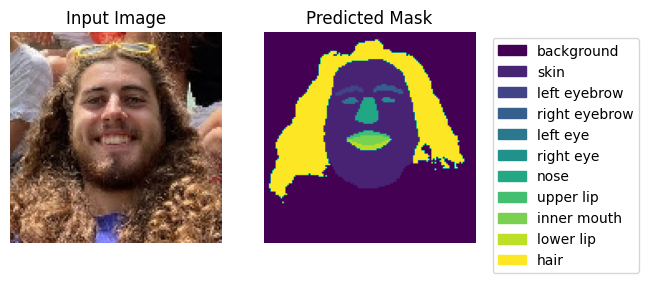

...

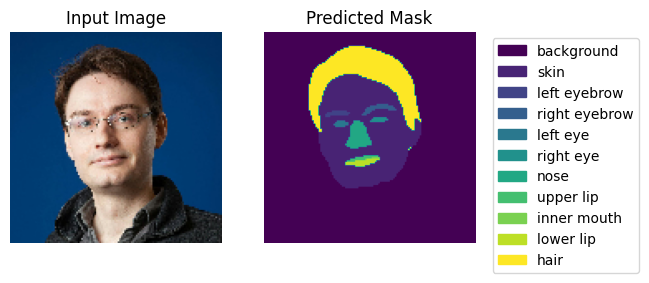

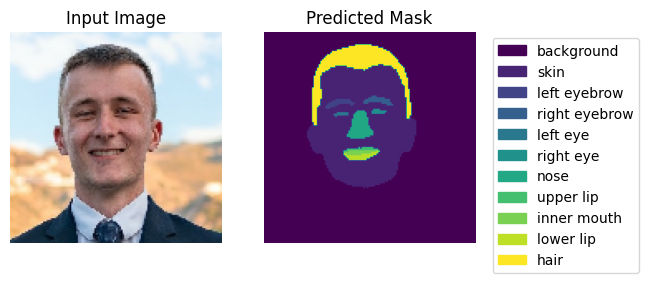

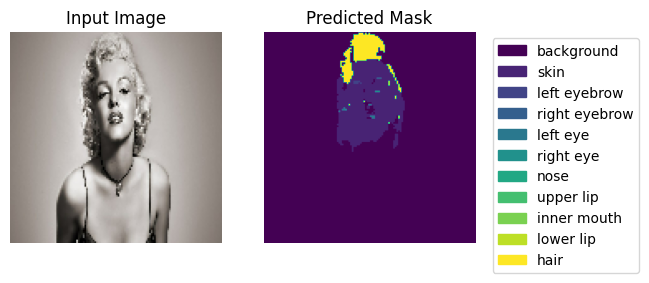

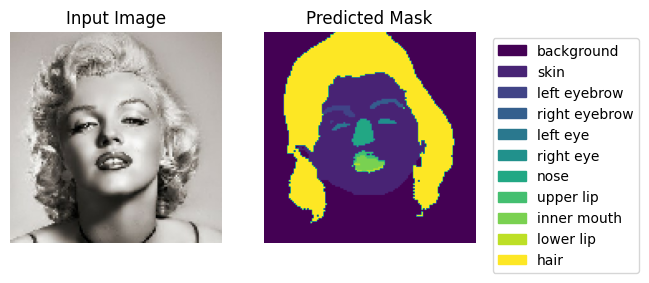

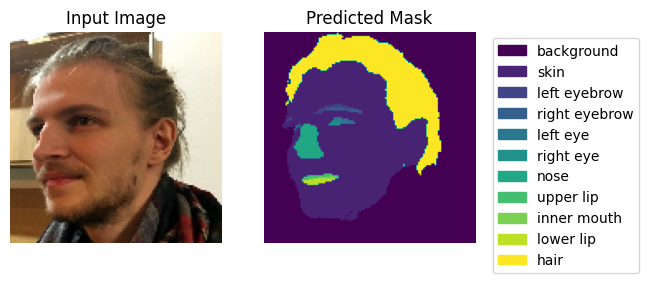

In [48]:
predict_list_of_image(images_perso_path, UNet_4_face_saved)

On a un biais évitable (avoidable bias) de 4 % et très peu de variance (puisque val_acc = acc). <br>
Pour progresser il conviendrait de se concentrer sur le biais puisque notre modèle semble déjà bien généralisé !
Les solutions qu'on exclue :
- ajouter plus de data (on va même réduire leur nombre pour conserver un délais d'entraînement décent)
- regularization, elle existe déjà dans notre modèle

Les solutions qu'on conserve :
- allonger la durée d'entraînement du model, pour l'instant on est plutôt en underfitting (+ d'epochs)
- changer les hyperparamètres (dimension des inputs, nombre de filtre) 

On sauvegarde ce modèle dans le dossier "saved_model".

On affiche une matrice de confusion pour cerner quels sont les labels qu'on a le plus de mal à authentifier.

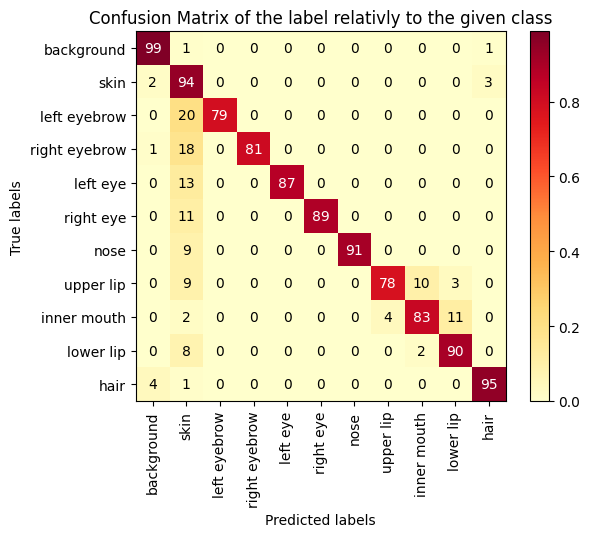

<Figure size 2000x2000 with 0 Axes>

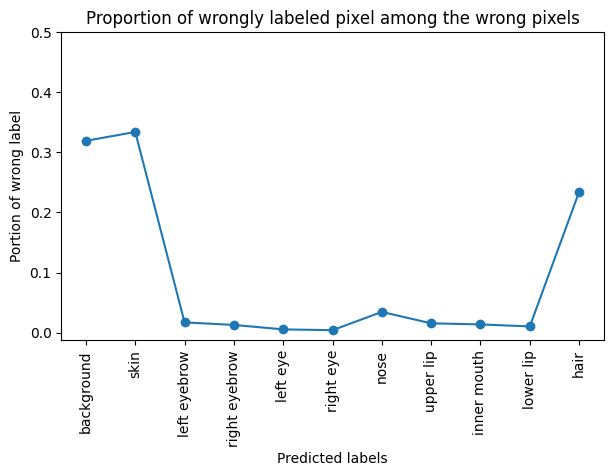

In [49]:
afficher_confusion_matrix(test_x, test_y, UNet_4_face_saved, 10)

Il semblerait que la bouche interne soit la zone la moins bien identifiée, avec la lèvre supérieure.<br>
De manière manière général la plupart des erreurs de notre modèle réside dans une labelissation erronés des zones intérieur du visage (tout sauf le background et les cheveux) en "peau".
Un axe de progression pourrait être d'ajouter une pénalité au model lorsqu'on attribue par erreur le label "skin" à une partie du visage différente du background.

## Second training : 64 filtres, 5 000 images, 128x128, 20 epochs

On réentraîne notre model avec un data_set de 5k images, 64 filtres et 20 epochs.

In [50]:
EPOCHS = 20
FILTERS = 64
image_h, image_w = 128, 128
num_classes = 11
IMAGE_MAX = 5_000

(train_x, train_y), (valid_x, valid_y), (test_x, test_y) = load_dataset(data_set_path)
train_x, train_y = train_x[:IMAGE_MAX], train_y[:IMAGE_MAX]

print(f"""
X_Train_set: {len(train_x)};
Y_Train_set: {len(train_y)};
""")


X_Train_set: 5000;
Y_Train_set: 5000;



In [51]:
train_dataset = fusion_dataset(train_x, train_y)
test_dataset = fusion_dataset(test_x, test_y)

(128, 128, 3)
(128, 128, 3)


In [52]:
# dérouler le notebook pour voir la définition des datasets. Les batchs ont une taille de 32 pour l'instant
UNet_4_face_64 = unet_model(input_size=(image_h, image_w, 3), n_filters=FILTERS, n_classes=num_classes)

In [53]:
UNet_4_face_64.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

In [54]:
UNet_4_face_64.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 128, 128, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_20 (Conv2D)             (None, 128, 128, 64  1792        ['input_2[0][0]']                
                                )                                                                 
                                                                                                  
 conv2d_21 (Conv2D)             (None, 128, 128, 64  36928       ['conv2d_20[0][0]']              
                                )                                                           

On passe à 34 millions de paramètres...

In [55]:
#model_history_64 = UNet_4_face_64.fit(train_dataset,
#                                epochs=EPOCHS,
#                                validation_data= test_dataset
#                               )

Capture d'écran de l'entraînement :

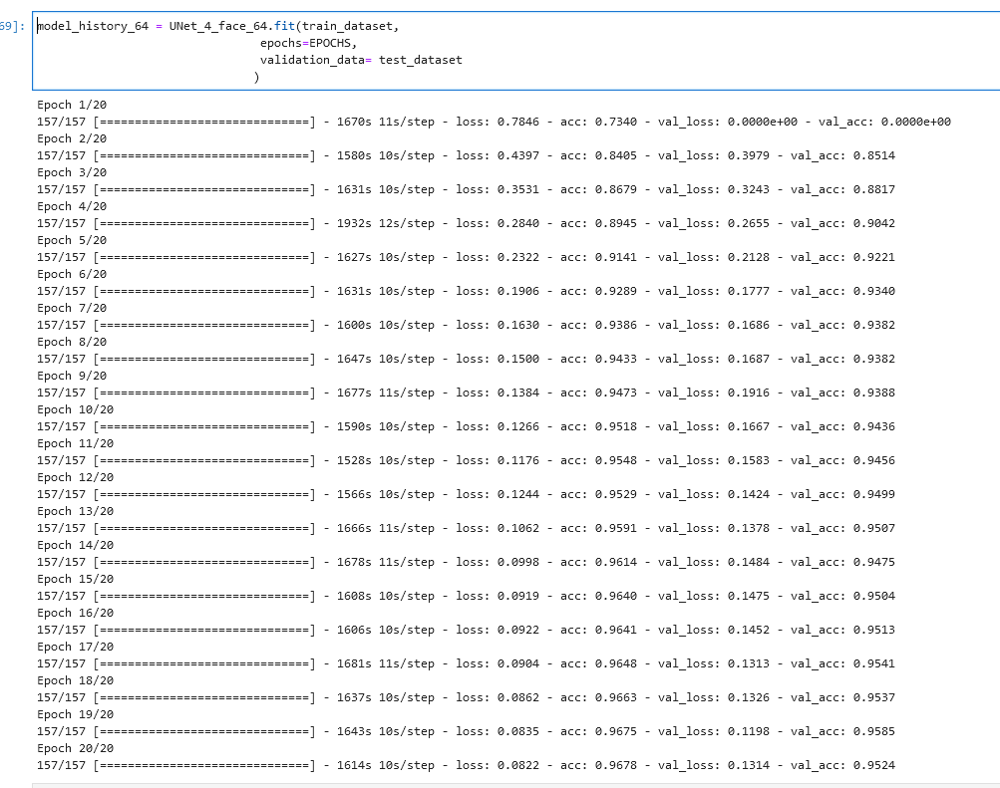

In [56]:
IPython.display.Image('illustrations/preuve_training_64filtres.png')

In [57]:
#UNet_4_face_64.save('saved_model/64filters_epoch20_5k_photos')
#np.save('saved_model/64filters_epoch20_5k_photos.npy',model_history_64.history)

In [58]:
UNet_4_face_64_saved = tf.keras.models.load_model('saved_model/64filters_epoch20_5k_photos')
model_history_UNet_4_face_64_saved =np.load('saved_model/64filters_epoch20_5k_photos.npy',allow_pickle='TRUE').item()

In [59]:
print("train_acc=", model_history_UNet_4_face_64_saved['acc'])
print("test_acc=", model_history_UNet_4_face_64_saved['val_acc'])

train_acc= [0.7243646, 0.8373533, 0.8646109, 0.88597643, 0.90497905, 0.919156, 0.9305993, 0.93923736, 0.9448282, 0.94898367, 0.95084727, 0.9543948, 0.9569975, 0.9599128, 0.9615485, 0.96210855, 0.96358913, 0.96615565, 0.9662043, 0.96730244]
test_acc= [0.8295252, 0.8525656, 0.87788844, 0.8968687, 0.916063, 0.9250047, 0.9327617, 0.9394439, 0.9390749, 0.9425817, 0.9442528, 0.9458045, 0.95176214, 0.95025456, 0.94959897, 0.95178777, 0.9553355, 0.9556711, 0.9565896, 0.95797443]


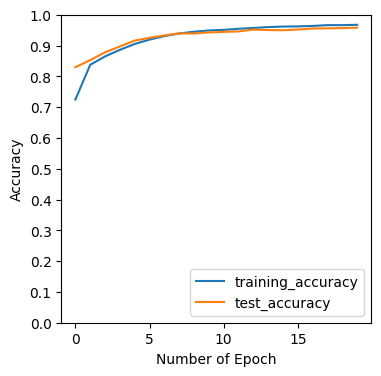

In [60]:
afficher_accuracy(model_history_UNet_4_face_64_saved)

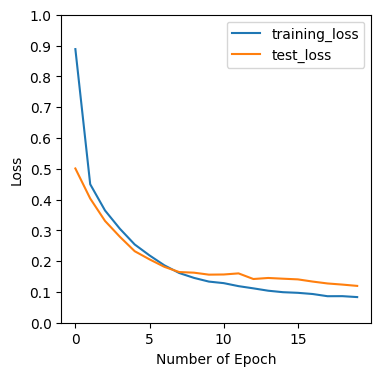

In [61]:
afficher_lost(model_history_UNet_4_face_64_saved)

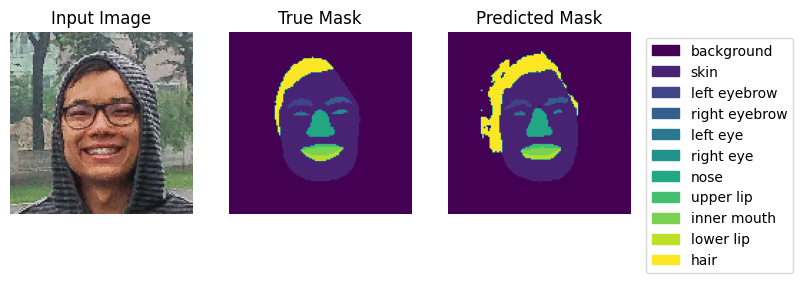

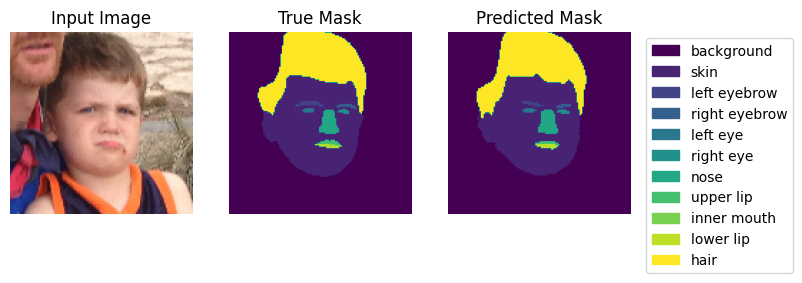

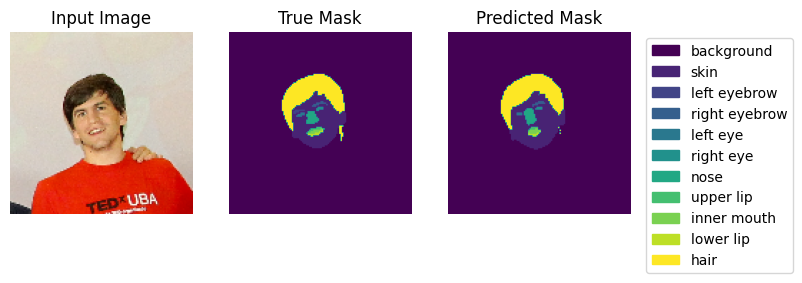

In [62]:
show_predictions(UNet_4_face_64_saved, train_dataset, 3)

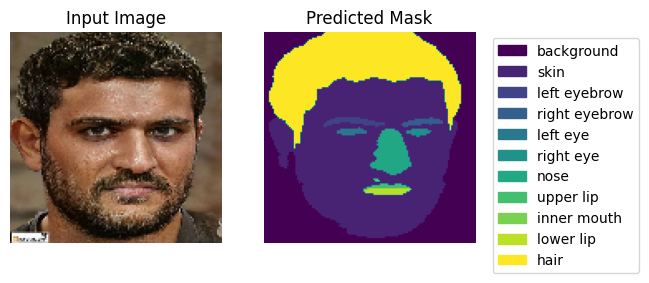

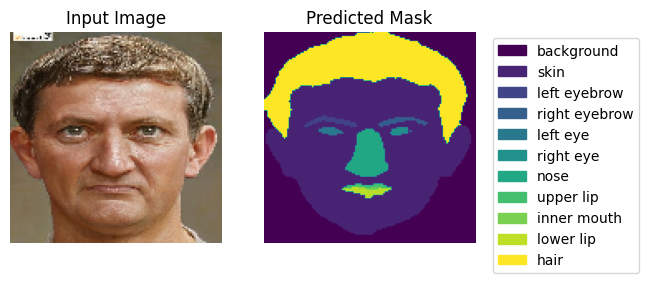

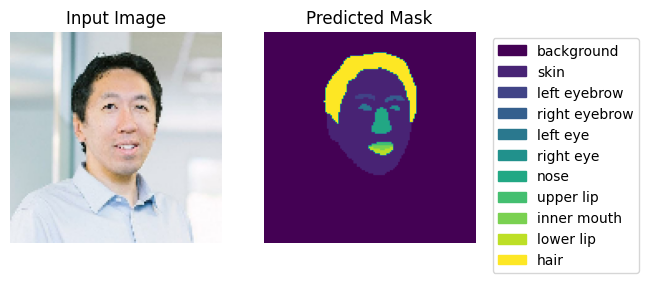

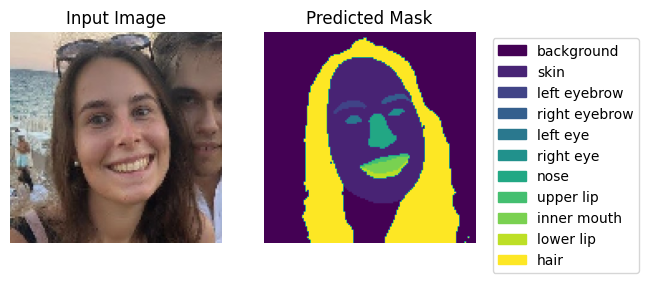

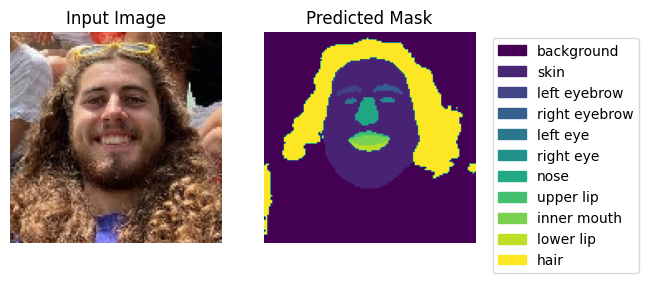

...

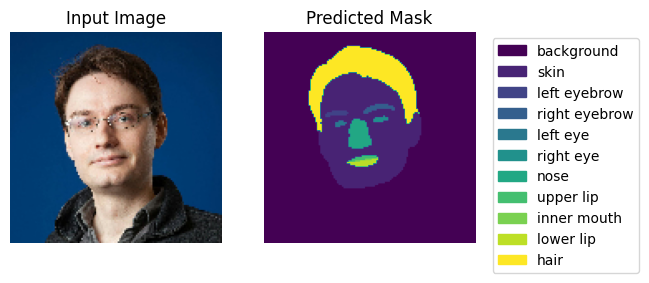

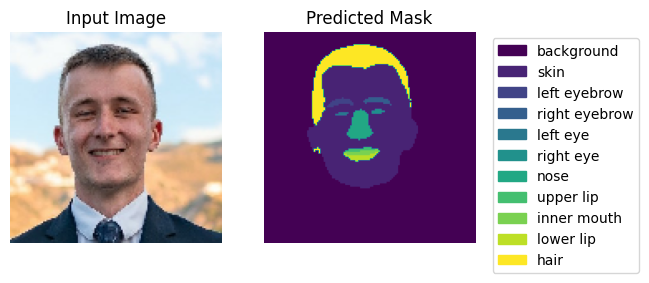

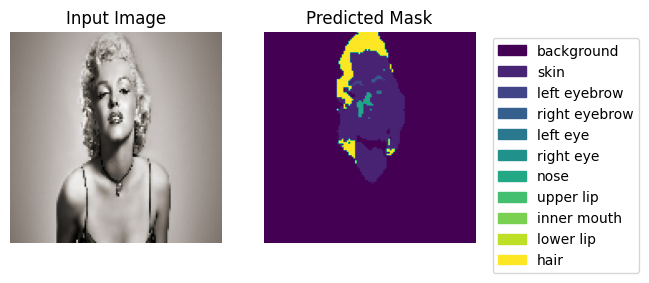

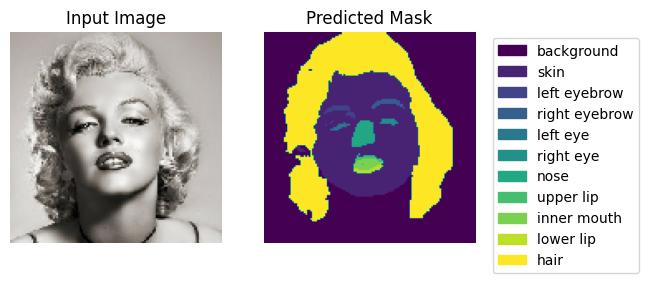

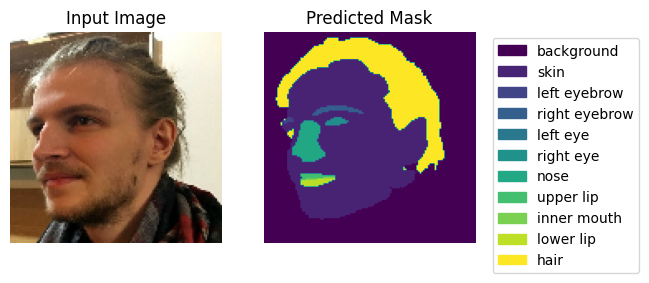

In [63]:
predict_list_of_image(images_perso_path, UNet_4_face_64_saved)

Manifestement on a mieux identifié la chevelure de l'empereur Tibère (deuxième photos).

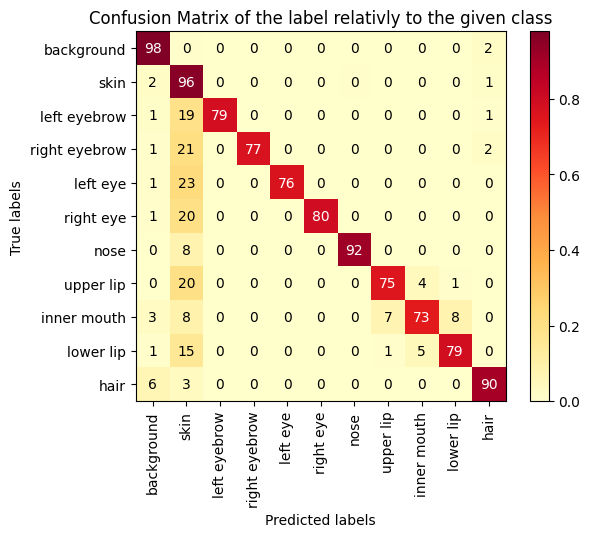

<Figure size 2000x2000 with 0 Axes>

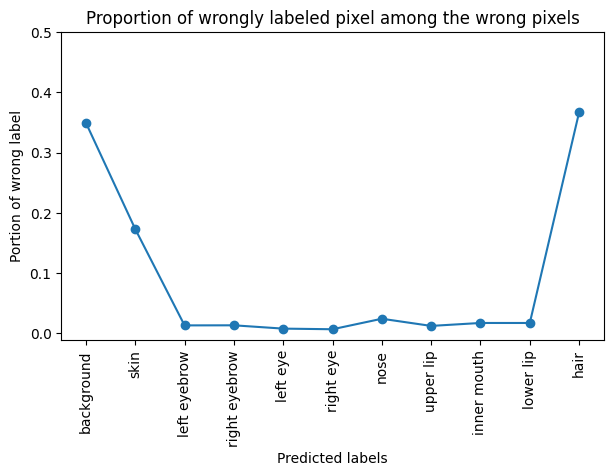

In [64]:
afficher_confusion_matrix(test_x, test_y, UNet_4_face_64_saved, 100)

## 3e Training: 32 filtres, 10 epochs, 256 * 256, 10k

In [65]:
EPOCHS = 20
FILTERS = 32
image_h, image_w = 256, 256
num_classes = 11
IMAGE_MAX = 10_000

(train_x, train_y), (valid_x, valid_y), (test_x, test_y) = load_dataset(data_set_path)
train_x, train_y = train_x[:IMAGE_MAX], train_y[:IMAGE_MAX]

print(len(train_x))

# dérouler le notebook pour voir la définition des datasets. Les batchs ont une taille de 32 pour l'instant
UNet_4_face_32_256px = unet_model(input_size=(image_h, image_w, 3), n_filters=FILTERS, n_classes=num_classes)

10000


In [66]:
UNet_4_face_32_256px.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

In [67]:
train_dataset = fusion_dataset(train_x, train_y)  # with new height and width
test_dataset = fusion_dataset(test_x, test_y)

(256, 256, 3)
(256, 256, 3)


In [68]:
#model_history_32_256px = UNet_4_face_32_256px.fit(train_dataset,
#                                epochs=EPOCHS,
#                                validation_data= test_dataset
#                                  )

In [69]:
#UNet_4_face_32_256px.save('saved_model/32filters_epoch20_10k_photos_256px')

In [70]:
UNet_4_face_32_256px_saved = tf.keras.models.load_model('saved_model/32filters_epoch20_10k_photos_256px')
history_UNet_4_face_32_256px_saved =np.load('saved_model/history_history_32_256px.npy',allow_pickle='TRUE').item()

In [71]:
print("train_acc=", history_UNet_4_face_32_256px_saved['acc'])
print("test_acc=", history_UNet_4_face_32_256px_saved['val_acc'])

train_acc= [0.7333204, 0.82786316, 0.8438661, 0.87319434, 0.90984637, 0.92780095, 0.9397507, 0.94564617, 0.95113534, 0.95504606]
test_acc= [0.7848423, 0.81812125, 0.83186126, 0.8917083, 0.92016417, 0.93382686, 0.9405344, 0.9440518, 0.9496845, 0.9531783]


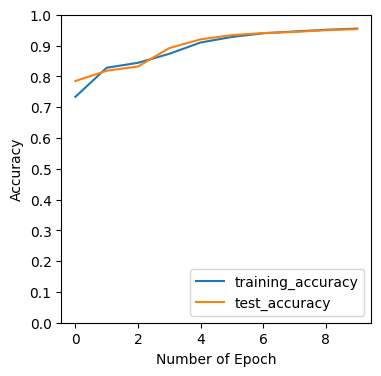

In [72]:
afficher_accuracy(history_UNet_4_face_32_256px_saved)

Toujours pas de variance !

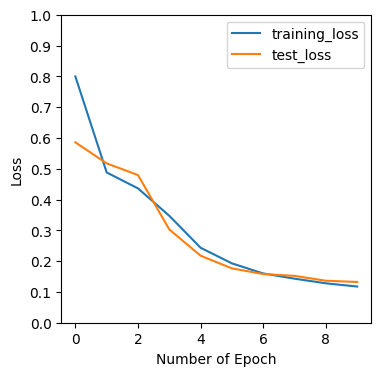

In [73]:
afficher_lost(history_UNet_4_face_32_256px_saved)

In [74]:
#UNet_4_face_32_256px_saved.summary()

In [75]:
perso_path = 'perso/'
images_perso_path = sorted(glob(os.path.join(perso_path, "*.jpg")))

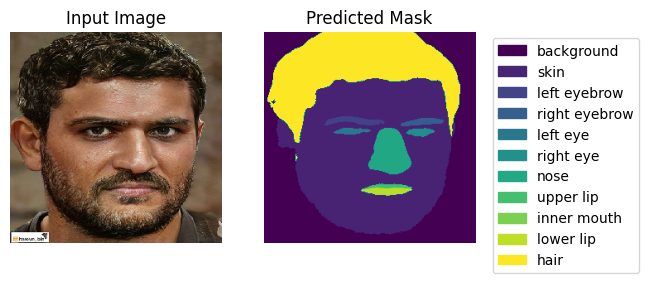

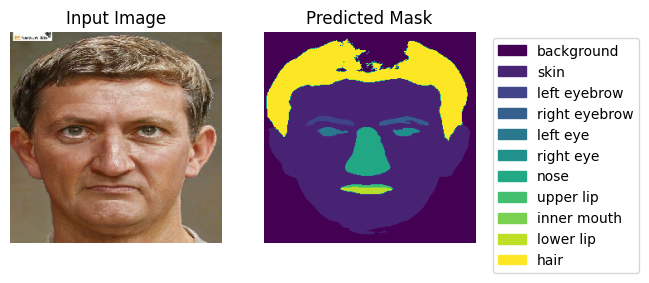

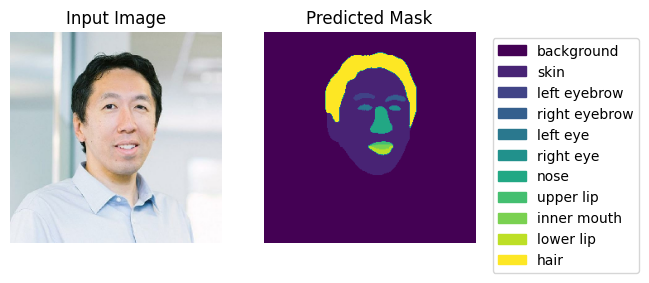

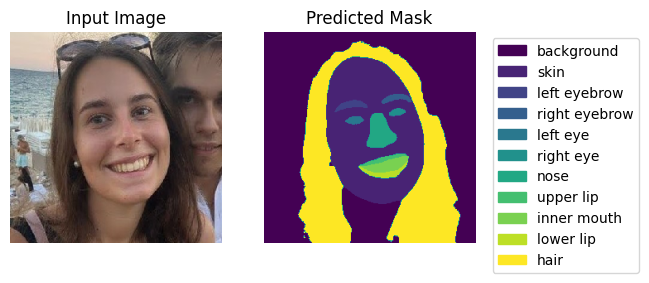

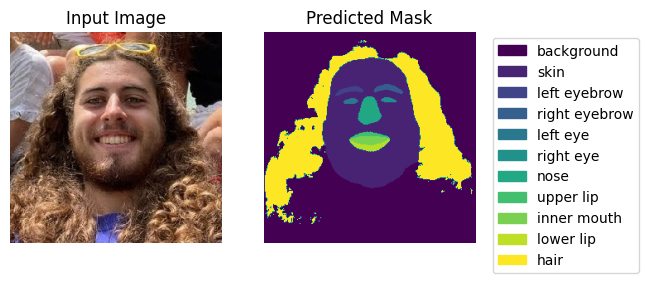

...

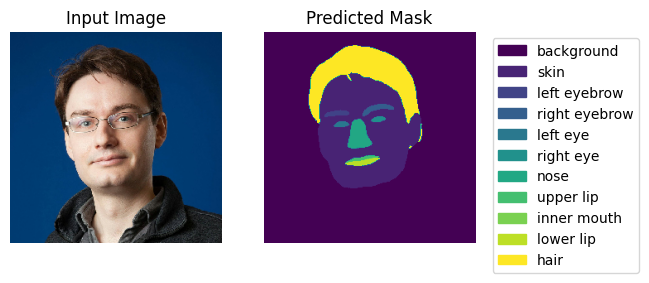

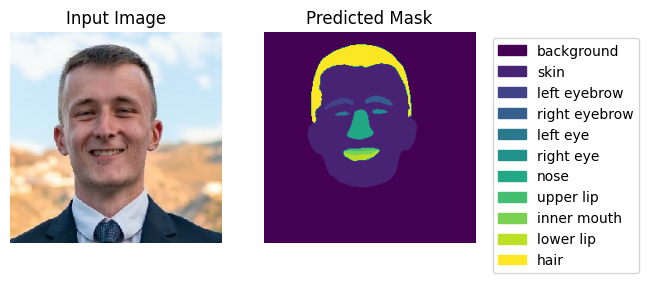

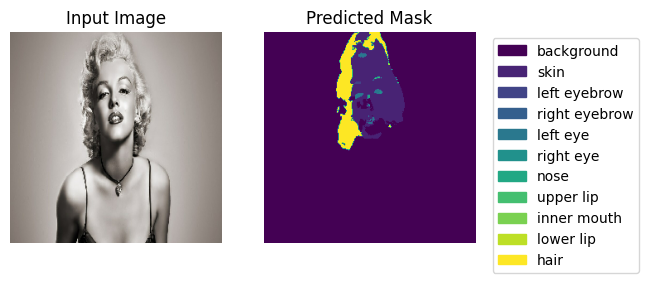

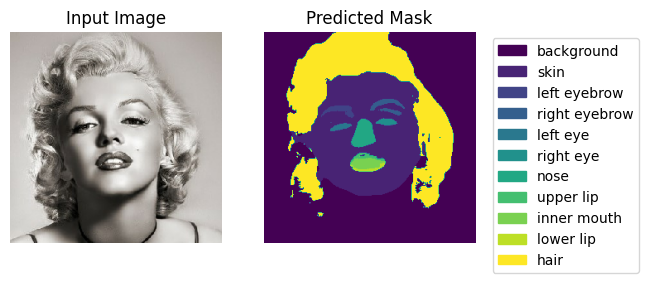

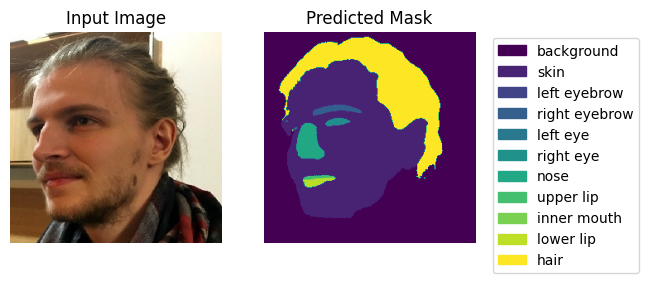

In [76]:
predict_list_of_image(images_perso_path, UNet_4_face_32_256px_saved)

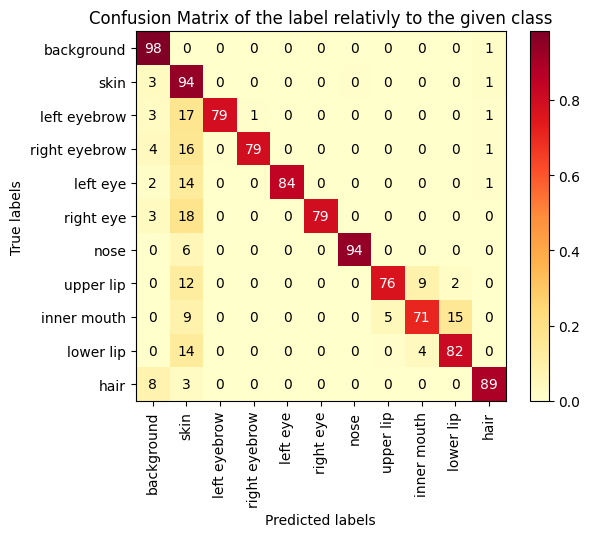

<Figure size 2000x2000 with 0 Axes>

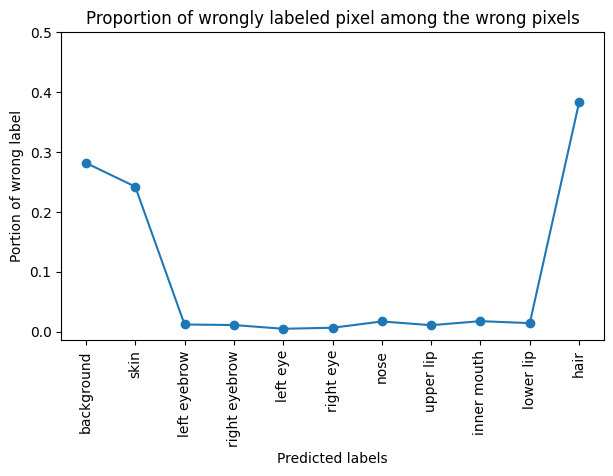

In [77]:
afficher_confusion_matrix(test_x, test_y, UNet_4_face_32_256px_saved, 100)

### Analyse :

Manifestement, modifier la dimension des images du training ne changent pas significativement les résultats de notre modèle mais augmente drastiquement son temps d'entraînement (une dizaine d'heure de mon côté).

La meilleure manière d'améliorer notre model est de l'entraîner plus longtemps (donc + d'epochs) et de le complexifier (+ de filtres, passer à l'architecture U2Net)

## Axes de progression

- Coupler notre système avec un algorithme YOLO pour résoudre le problème du centrage en le faisant choisir le centrage le plus adapté à chaque photo (ou utiliser un training-set + varié)
- Utiliser une autre loss function (Dice loss, Jaccard loss ?)
- Investir dans une vraie GPU

In [78]:
tf.config.experimental.list_physical_devices(device_type=None)

[PhysicalDevice(name='/physical_device:CPU:0', device_type='CPU')]

In [79]:
UNet_4_face_saved = tf.keras.models.load_model('saved_model/32filters_epoch10_10k_photos')

In [80]:
img = tf.io.read_file('LaPa/train/images/626176_0.jpg')
img = tf.io.decode_jpeg(img, channels=3) # RGB en sortie
img = tf.image.convert_image_dtype(img, tf.float32)

input_image_rs = tf.image.resize(img, (image_h, image_w), method='nearest')
input_image = input_image_rs[tf.newaxis, ...]
print("input_image = ", input_image.shape)

mask = tf.io.read_file('LaPa/train/labels/626176_0.png')
mask = tf.image.decode_png(mask, channels=1)

input_image_mask = tf.image.resize(mask, (image_h, image_w), method='nearest')
input_image_mask = input_image_mask[tf.newaxis, ...]
print("input_mask = ", input_image_mask.shape)

image_prediction = UNet_4_face_saved.predict(input_image)
print("pred_mask =", image_prediction.shape)
image_prediction[0, 0, 0, :]
tf.nn.softmax(image_prediction[0, 0, 0, :])

input_image =  (1, 256, 256, 3)
input_mask =  (1, 256, 256, 1)


ValueError: in user code:

    File "D:\Programmes\symbolik_link\pypoetry\Cache\virtualenvs\facial-information-recognition-9Q4vOELU-py3.8\lib\site-packages\keras\engine\training.py", line 2041, in predict_function  *
        return step_function(self, iterator)
    File "D:\Programmes\symbolik_link\pypoetry\Cache\virtualenvs\facial-information-recognition-9Q4vOELU-py3.8\lib\site-packages\keras\engine\training.py", line 2027, in step_function  **
        outputs = model.distribute_strategy.run(run_step, args=(data,))
    File "D:\Programmes\symbolik_link\pypoetry\Cache\virtualenvs\facial-information-recognition-9Q4vOELU-py3.8\lib\site-packages\keras\engine\training.py", line 2015, in run_step  **
        outputs = model.predict_step(data)
    File "D:\Programmes\symbolik_link\pypoetry\Cache\virtualenvs\facial-information-recognition-9Q4vOELU-py3.8\lib\site-packages\keras\engine\training.py", line 1983, in predict_step
        return self(x, training=False)
    File "D:\Programmes\symbolik_link\pypoetry\Cache\virtualenvs\facial-information-recognition-9Q4vOELU-py3.8\lib\site-packages\keras\utils\traceback_utils.py", line 70, in error_handler
        raise e.with_traceback(filtered_tb) from None
    File "D:\Programmes\symbolik_link\pypoetry\Cache\virtualenvs\facial-information-recognition-9Q4vOELU-py3.8\lib\site-packages\keras\engine\input_spec.py", line 295, in assert_input_compatibility
        raise ValueError(

    ValueError: Input 0 of layer "model" is incompatible with the layer: expected shape=(None, 128, 128, 3), found shape=(None, 256, 256, 3)


In [ ]:

print(image_prediction[:, :, :, 1])

custom_loss_skin(input_image_mask, image_prediction)

In [ ]:
EPOCHS = 10
FILTERS = 64
image_h, image_w = 128, 128
num_classes = 11
IMAGE_MAX = 1000

(train_x, train_y), (valid_x, valid_y), (test_x, test_y) = load_dataset(data_set_path)
train_x, train_y = train_x[:IMAGE_MAX], train_y[:IMAGE_MAX]
test_x, test_y = test_x[:IMAGE_MAX], test_y[:IMAGE_MAX]


print(f"""
X_Train_set: {len(train_x)};
Y_Train_set: {len(train_y)};
X_Test_set: {len(train_x)};
Y_Test_set: {len(train_y)};
""")

train_dataset = fusion_dataset(train_x, train_y)
test_dataset = fusion_dataset(test_x, test_y)

In [ ]:
PENALTY = 0.1    # Some scalar value that determines the strength of the penalty


def custom_loss_skin(y_true, y_pred):
    loss = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True)(y_true, y_pred)    
    y_pred = tf.nn.softmax(y_pred) # on calcule les "chances" que le pixel soit de chaque classe selon le modèle
    skin_class_index = body_part.index("skin")
    prob_diff = y_pred[:, :, :, skin_class_index] - 
    #- tf.reduce_max(y_pred, axis=-1) # < 0 si c'est bien un "skin" > 0 sinon
    
    # si le pixel n'est pas incorrectement classifé comme "skin", on renvoie 0
    num_incorrect = tf.reduce_sum(tf.cast(tf.math.greater(prob_diff, 0), tf.float32))
    
    # on ajoute une pénalité proportionnel au nombre de pixels faussement classé dans la catégorie "skin"
    loss += PENALTY * num_incorrect
    
    return loss

In [ ]:
UNet_4_face_custom_loss = unet_model(input_size=(image_h, image_w, 3), n_filters=FILTERS, n_classes=num_classes)

In [ ]:
UNet_4_face_custom_loss.compile(optimizer='adam', loss=custom_loss_skin, metrics=['accuracy'])

In [ ]:
#model_history_64filters_custom_loss = UNet_4_face_custom_loss.fit(train_dataset,
#                                epochs=EPOCHS,
#                                validation_data= test_dataset)

In [ ]:
afficher_confusion_matrix(test_x, test_y, UNet_4_face_custom_loss, 100)

In [ ]:
UNet_4_face_custom_loss.save('saved_model/bad_loss')

C'est un échec total